## Red Neuronal Inception V3 Tesis
# Juan David Galan Vargas - 202111470

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import os
import keras
from keras.models import Sequential
from keras import backend as K
from keras.layers import Input
import pandas as pd
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import csv
import pydot
from tensorflow.keras.utils import plot_model
import tensorflow.keras.backend as K
from sklearn.metrics import f1_score
import matplotlib.colors as mcolors

c:\Users\juang\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
c:\Users\juang\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
cumulos_folder_shell1=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell1\cumulos"
nocumulos_folder_shell1=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell1\no-cumulos"

cumulos_folder_shell2=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell2\cumulos"
nocumulos_folder_shell2=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell2\no-cumulos"

shell1=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell1"
shell2=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\muestra_entrenamiento\shell2"

clasificar_shell1=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2_diagramas\shell1\prueba"
clasificar_shell2=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2_diagramas\shell2\prueba"

### Shell 1

In [3]:
# Data generators
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=False,
    vertical_flip=False,
#    validation_split=0.2  # 20% for validation
)

# CAMBIAR SHELL 1 O SHELL 2
train_data_dir = shell1

# Training data
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(253, 385),
    batch_size=32,
    class_mode='binary',
    classes=['no-cumulos', 'cumulos'],
    shuffle=True,
    #subset='training'  # Training set (80%)
)



Found 10272 images belonging to 2 classes.


In [4]:
def get_model():
    base_model = InceptionV3(input_shape = (253,385,3), weights='imagenet', include_top=False)
    x = base_model.output
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dense(1024, activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    #x = keras.layers.Dense(512, activation='relu')(x)
    #x = keras.layers.BatchNormalization()(x)
    predictions = keras.layers.Dense(1, activation='sigmoid')(x)
    model = keras.models.Model(inputs=base_model.input, outputs=predictions)
    for layer in base_model.layers:
        layer.trainable = False #Originalmente False, True en prueba
        
    for layer in base_model.layers[-150:]:
        layer.trainable = True
    return model
model = get_model()

# Compile the model


In [5]:
METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
]
model.compile(
    optimizer=keras.optimizers.Adam(0.001),
    loss='binary_crossentropy',
    metrics=METRICS)

In [6]:
model.fit(
    train_generator,
    #validation_data=val_generator,
    epochs=15)

c:\Users\juang\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
321/321 ━━━━━━━━━━━━━━━━━━━━ 2656s 8s/step - accuracy: 0.8889 - auc: 0.9393 - fn: 320.8105 - fp: 152.1335 - loss: 0.3408 - precision: 0.9194 - recall: 0.8533 - tn: 2443.2268 - tp: 2251.7297
Epoch 2/15
321/321 ━━━━━━━━━━━━━━━━━━━━ 1512s 5s/step - accuracy: 0.9364 - auc: 0.9801 - fn: 219.2919 - fp: 113.6584 - loss: 0.1671 - precision: 0.9542 - recall: 0.9161 - tn: 2476.0278 - tp: 2358.9224
Epoch 3/15
 15/321 ━━━━━━━━━━━━━━━━━━━━ 15:51 3s/step - accuracy: 0.9448 - auc: 0.9864 - fn: 9.4000 - fp: 3.8667 - loss: 0.1462 - precision: 0.9765 - recall: 0.9167 - tn: 120.6000 - tp: 122.1333

KeyboardInterrupt: 

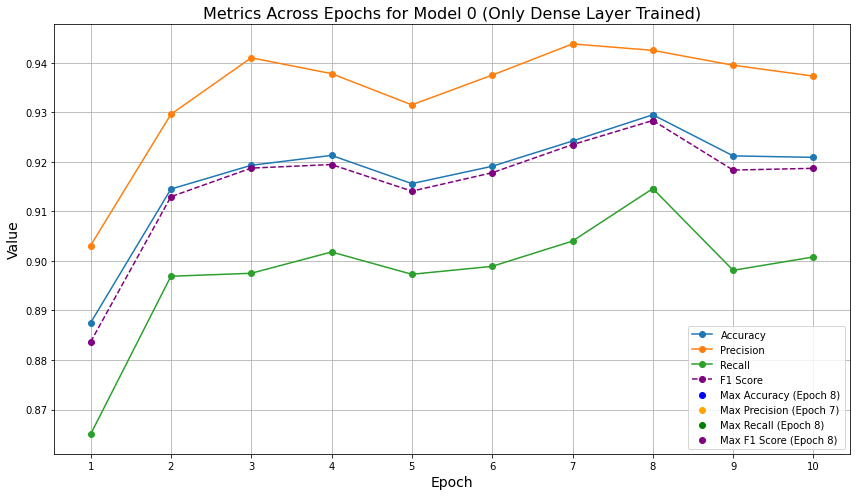

Highest Accuracy: 0.9295 at Epoch 8
Highest Precision: 0.9438 at Epoch 7
Highest Recall: 0.9146 at Epoch 8
Highest F1 Score: 0.9283404232405363 at Epoch 8


In [5]:
#MODELO 0
import matplotlib.pyplot as plt

# Metrics data from your training output
epochs = range(1, 11)
accuracy = [0.8875, 0.9145, 0.9193, 0.9213, 0.9156, 0.9191, 0.9242, 0.9295, 0.9212, 0.9209]
precision = [0.9031, 0.9296, 0.9410, 0.9378, 0.9315, 0.9375, 0.9438, 0.9425, 0.9395, 0.9373]
recall = [0.8650, 0.8969, 0.8975, 0.9018, 0.8973, 0.8989, 0.9040, 0.9146, 0.8981, 0.9008]

# Calculate F1 score for each epoch
f1_score = [2 * (p * r) / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

# Find the epoch with the highest F1 score
max_f1_epoch = f1_score.index(max(f1_score)) + 1

# Plot the metrics
plt.figure(figsize=(12, 7))
plt.plot(epochs, accuracy, label='Accuracy', marker='o')
plt.plot(epochs, precision, label='Precision', marker='o')
plt.plot(epochs, recall, label='Recall', marker='o')
plt.plot(epochs, f1_score, label='F1 Score', marker='o', linestyle='--', color='purple')

# Highlight the highest points
max_acc_epoch = accuracy.index(max(accuracy)) + 1
max_prec_epoch = precision.index(max(precision)) + 1
max_recall_epoch = recall.index(max(recall)) + 1

plt.scatter(max_acc_epoch, max(accuracy), color='blue', label=f"Max Accuracy (Epoch {max_acc_epoch})")
plt.scatter(max_prec_epoch, max(precision), color='orange', label=f"Max Precision (Epoch {max_prec_epoch})")
plt.scatter(max_recall_epoch, max(recall), color='green', label=f"Max Recall (Epoch {max_recall_epoch})")
plt.scatter(max_f1_epoch, max(f1_score), color='purple', label=f"Max F1 Score (Epoch {max_f1_epoch})")

# Add labels, legend, and title
plt.title("Metrics Across Epochs for Model 0 (Only Dense Layer Trained)", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.xticks(epochs)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

# Print the highest values and their epochs
print(f"Highest Accuracy: {max(accuracy)} at Epoch {max_acc_epoch}")
print(f"Highest Precision: {max(precision)} at Epoch {max_prec_epoch}")
print(f"Highest Recall: {max(recall)} at Epoch {max_recall_epoch}")
print(f"Highest F1 Score: {max(f1_score)} at Epoch {max_f1_epoch}")


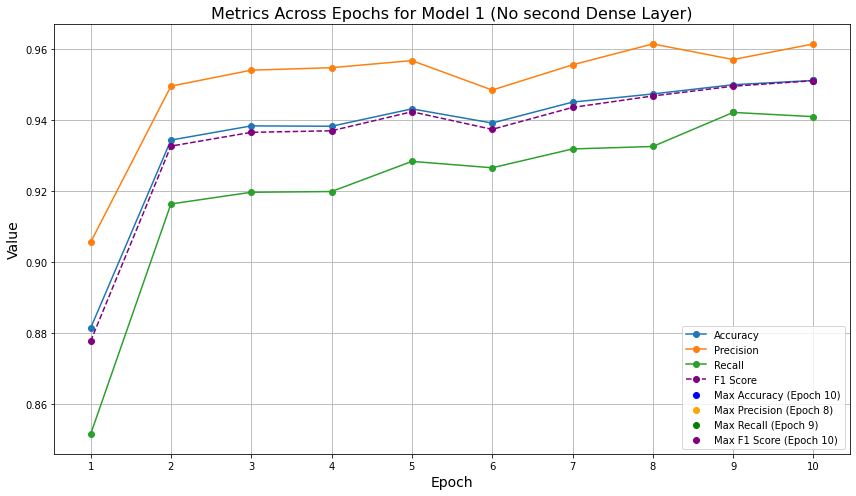

Highest Accuracy: 0.9512 at Epoch 10
Highest Precision: 0.9615 at Epoch 8
Highest Recall: 0.9422 at Epoch 9
Highest F1 Score: 0.9511395532194481 at Epoch 10


In [ ]:
#MODELO 1
epochs = list(range(1, 11))  # Epochs 1 to 10

accuracy = [0.8814, 0.9344, 0.9384, 0.9383, 0.9432, 0.9392, 0.9451, 0.9474, 0.9500, 0.9512]
auc = [0.9422, 0.9790, 0.9811, 0.9802, 0.9839, 0.9827, 0.9863, 0.9876, 0.9888, 0.9906]
fn = [331.7050, 224.2547, 204.9193, 199.1087, 192.4689, 188.5745, 174.5807, 164.6429, 153.7950, 154.9783]
fp = [190.5248, 133.0217, 114.5435, 114.9565, 113.8758, 120.6553, 109.1677, 101.3789, 99.2733, 99.3758]
loss = [0.3159, 0.1737, 0.1650, 0.1669, 0.1502, 0.1598, 0.1410, 0.1343, 0.1296, 0.1204]
precision = [0.9056, 0.9496, 0.9541, 0.9548, 0.9568, 0.9485, 0.9556, 0.9615, 0.9571, 0.9615]
recall = [0.8515, 0.9164, 0.9197, 0.9199, 0.9284, 0.9266, 0.9319, 0.9326, 0.9422, 0.9410]
tn = [2372.2144, 2466.4131, 2483.5684, 2469.3262, 2466.6926, 2481.4875, 2483.9473, 2472.1987, 2482.8540, 2466.0684]
tp = [2273.4565, 2344.2112, 2364.8696, 2384.5093, 2394.8633, 2377.1833, 2400.2051, 2429.6802, 2431.9783, 2447.4783]
# Calculate the F1 score for each epoch
f1_score = [2 * (p * r) / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

# Find the epoch with the highest F1 score
max_f1_epoch = f1_score.index(max(f1_score)) + 1

# Plot the metrics
plt.figure(figsize=(12, 7))
plt.plot(epochs, accuracy, label='Accuracy', marker='o')
plt.plot(epochs, precision, label='Precision', marker='o')
plt.plot(epochs, recall, label='Recall', marker='o')
plt.plot(epochs, f1_score, label='F1 Score', marker='o', linestyle='--', color='purple')

# Highlight the highest points
max_acc_epoch = accuracy.index(max(accuracy)) + 1
max_prec_epoch = precision.index(max(precision)) + 1
max_recall_epoch = recall.index(max(recall)) + 1

plt.scatter(max_acc_epoch, max(accuracy), color='blue', label=f"Max Accuracy (Epoch {max_acc_epoch})")
plt.scatter(max_prec_epoch, max(precision), color='orange', label=f"Max Precision (Epoch {max_prec_epoch})")
plt.scatter(max_recall_epoch, max(recall), color='green', label=f"Max Recall (Epoch {max_recall_epoch})")
plt.scatter(max_f1_epoch, max(f1_score), color='purple', label=f"Max F1 Score (Epoch {max_f1_epoch})")

# Add labels, legend, and title
plt.title("Metrics Across Epochs for Model 1 (No second Dense Layer, 100 Layers)", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.xticks(epochs)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

# Print the highest values and their epochs
print(f"Highest Accuracy: {max(accuracy)} at Epoch {max_acc_epoch}")
print(f"Highest Precision: {max(precision)} at Epoch {max_prec_epoch}")
print(f"Highest Recall: {max(recall)} at Epoch {max_recall_epoch}")
print(f"Highest F1 Score: {max(f1_score)} at Epoch {max_f1_epoch}")


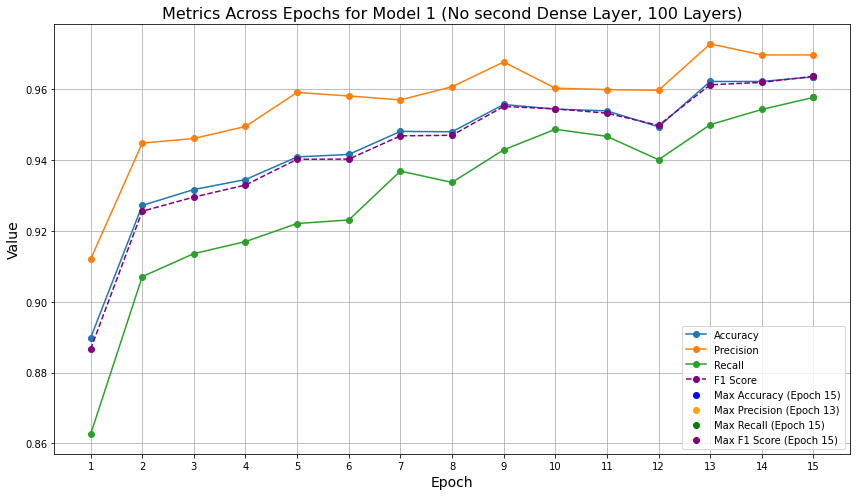

Highest Accuracy: 0.9635 at Epoch 15
Highest Precision: 0.9728 at Epoch 13
Highest Recall: 0.9577 at Epoch 15
Highest F1 Score: 0.9636626439763412 at Epoch 15


In [4]:
#Modelo 
epochs = np.arange(1, 16)
accuracy = [0.8898, 0.9272, 0.9317, 0.9345, 0.9409, 0.9416, 0.9481, 0.9480, 0.9557, 0.9544, 0.9539, 0.9494, 0.9622, 0.9622, 0.9635]
precision = [0.9120, 0.9448, 0.9461, 0.9495, 0.9591, 0.9581, 0.9570, 0.9607, 0.9677, 0.9603, 0.9599, 0.9597, 0.9728, 0.9697, 0.9697]
recall = [0.8626, 0.9071, 0.9136, 0.9170, 0.9221, 0.9231, 0.9369, 0.9337, 0.9429, 0.9487, 0.9467, 0.9401, 0.9500, 0.9543, 0.9577]

# Compute F1 score
f1_score = [2 * (p * r) / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

# Find the epoch with the highest F1 score
max_f1_epoch = f1_score.index(max(f1_score)) + 1

# Plot the metrics
plt.figure(figsize=(12, 7))
plt.plot(epochs, accuracy, label='Accuracy', marker='o')
plt.plot(epochs, precision, label='Precision', marker='o')
plt.plot(epochs, recall, label='Recall', marker='o')
plt.plot(epochs, f1_score, label='F1 Score', marker='o', linestyle='--', color='purple')

# Highlight the highest points
max_acc_epoch = accuracy.index(max(accuracy)) + 1
max_prec_epoch = precision.index(max(precision)) + 1
max_recall_epoch = recall.index(max(recall)) + 1

plt.scatter(max_acc_epoch, max(accuracy), color='blue', label=f"Max Accuracy (Epoch {max_acc_epoch})")
plt.scatter(max_prec_epoch, max(precision), color='orange', label=f"Max Precision (Epoch {max_prec_epoch})")
plt.scatter(max_recall_epoch, max(recall), color='green', label=f"Max Recall (Epoch {max_recall_epoch})")
plt.scatter(max_f1_epoch, max(f1_score), color='purple', label=f"Max F1 Score (Epoch {max_f1_epoch})")

# Add labels, legend, and title
plt.title("Metrics Across Epochs for Model 1 (No second Dense Layer, 100 Layers)", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.xticks(epochs)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

# Print the highest values and their epochs
print(f"Highest Accuracy: {max(accuracy)} at Epoch {max_acc_epoch}")
print(f"Highest Precision: {max(precision)} at Epoch {max_prec_epoch}")
print(f"Highest Recall: {max(recall)} at Epoch {max_recall_epoch}")
print(f"Highest F1 Score: {max(f1_score)} at Epoch {max_f1_epoch}")


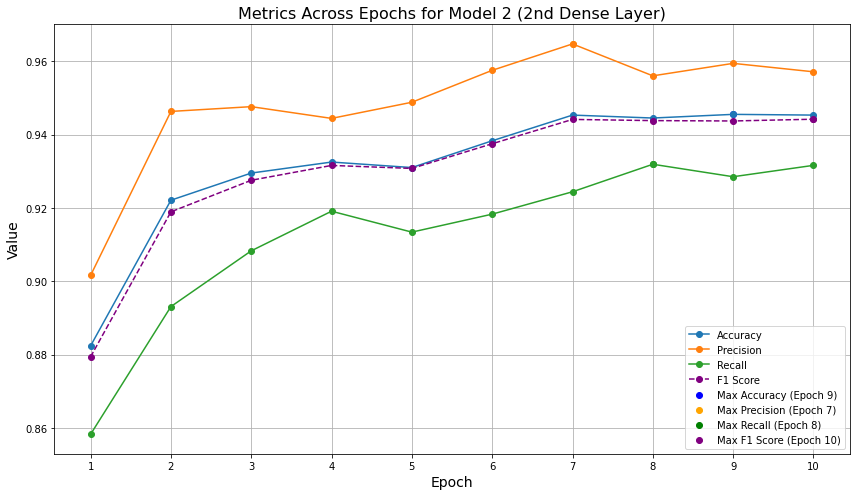

Highest Accuracy: 0.9455 at Epoch 9
Highest Precision: 0.9647 at Epoch 7
Highest Recall: 0.9319 at Epoch 8
Highest F1 Score: 0.9441778577857786 at Epoch 10


In [18]:
#MODELO 2
epochs = list(range(1, 11))  # Epochs 1 to 10

accuracy = [0.8824, 0.9221, 0.9295, 0.9325, 0.9310, 0.9383, 0.9453, 0.9445, 0.9455, 0.9453]
auc = [0.9418, 0.9721, 0.9779, 0.9805, 0.9797, 0.9833, 0.9847, 0.9868, 0.9860, 0.9870]
fn = [329.8696, 259.6397, 233.6801, 218.7609, 224.2795, 209.5435, 187.2888, 175.9845, 177.4006, 172.9317]
fp = [198.6211, 128.2764, 130.4845, 138.8634, 126.2360, 103.7453, 90.2857, 109.3385, 101.1087, 104.3571]
loss = [0.3316, 0.1991, 0.1777, 0.1718, 0.1741, 0.1563, 0.1445, 0.1373, 0.1437, 0.1390]
precision = [0.9016, 0.9463, 0.9476, 0.9444, 0.9488, 0.9575, 0.9647, 0.9560, 0.9594, 0.9571]
recall = [0.8583, 0.8931, 0.9083, 0.9191, 0.9134, 0.9183, 0.9244, 0.9319, 0.9285, 0.9316]
tn = [2397.5715, 2467.4067, 2456.2051, 2440.9006, 2429.2515, 2464.8508, 2493.6335, 2477.1086, 2509.8665, 2484.4380]
tp = [2241.8386, 2312.5776, 2347.5310, 2369.3757, 2388.1335, 2389.7610, 2396.6926, 2405.4690, 2379.5249, 2406.1738]
# Calculate the F1 score for each epoch
f1_score = [2 * (p * r) / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

# Find the epoch with the highest F1 score
max_f1_epoch = f1_score.index(max(f1_score)) + 1

# Plot the metrics
plt.figure(figsize=(12, 7))
plt.plot(epochs, accuracy, label='Accuracy', marker='o')
plt.plot(epochs, precision, label='Precision', marker='o')
plt.plot(epochs, recall, label='Recall', marker='o')
plt.plot(epochs, f1_score, label='F1 Score', marker='o', linestyle='--', color='purple')

# Highlight the highest points
max_acc_epoch = accuracy.index(max(accuracy)) + 1
max_prec_epoch = precision.index(max(precision)) + 1
max_recall_epoch = recall.index(max(recall)) + 1

plt.scatter(max_acc_epoch, max(accuracy), color='blue', label=f"Max Accuracy (Epoch {max_acc_epoch})")
plt.scatter(max_prec_epoch, max(precision), color='orange', label=f"Max Precision (Epoch {max_prec_epoch})")
plt.scatter(max_recall_epoch, max(recall), color='green', label=f"Max Recall (Epoch {max_recall_epoch})")
plt.scatter(max_f1_epoch, max(f1_score), color='purple', label=f"Max F1 Score (Epoch {max_f1_epoch})")

# Add labels, legend, and title
plt.title("Metrics Across Epochs for Model 2 (2nd Dense Layer)", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.xticks(epochs)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

# Print the highest values and their epochs
print(f"Highest Accuracy: {max(accuracy)} at Epoch {max_acc_epoch}")
print(f"Highest Precision: {max(precision)} at Epoch {max_prec_epoch}")
print(f"Highest Recall: {max(recall)} at Epoch {max_recall_epoch}")
print(f"Highest F1 Score: {max(f1_score)} at Epoch {max_f1_epoch}")



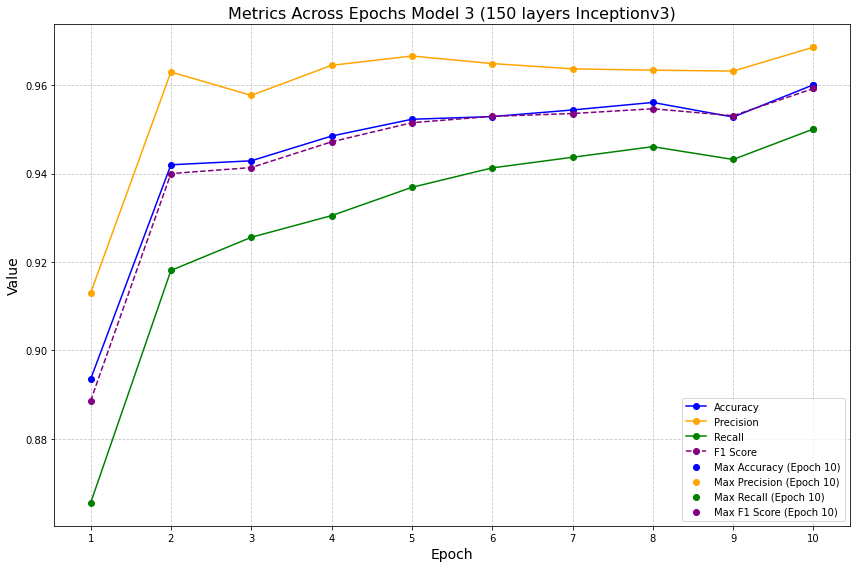

Highest Accuracy: 0.9601 at Epoch 10
Highest Precision: 0.9686 at Epoch 10
Highest Recall: 0.9501 at Epoch 10
Highest F1 Score: 0.9593 at Epoch 10


In [13]:
#MODELO 3
epochs = range(1, 11)
accuracy = [0.8935, 0.9420, 0.9429, 0.9485, 0.9523, 0.9529, 0.9544, 0.9561, 0.9528, 0.9601]
precision = [0.9130, 0.9630, 0.9577, 0.9645, 0.9666, 0.9649, 0.9637, 0.9634, 0.9632, 0.9686]
recall = [0.8655, 0.9181, 0.9256, 0.9305, 0.9369, 0.9413, 0.9437, 0.9461, 0.9432, 0.9501]

# Calculate F1 score for each epoch
f1_score = [2 * (p * r) / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

# Find the epochs with the highest values for each metric
max_acc_epoch = accuracy.index(max(accuracy)) + 1
max_prec_epoch = precision.index(max(precision)) + 1
max_recall_epoch = recall.index(max(recall)) + 1
max_f1_epoch = f1_score.index(max(f1_score)) + 1

# Plot the metrics
plt.figure(figsize=(12, 8))
plt.plot(epochs, accuracy, label="Accuracy", marker='o', color='blue')
plt.plot(epochs, precision, label="Precision", marker='o', color='orange')
plt.plot(epochs, recall, label="Recall", marker='o', color='green')
plt.plot(epochs, f1_score, label="F1 Score", marker='o', linestyle='--', color='purple')

# Highlight the highest points
plt.scatter(max_acc_epoch, max(accuracy), color='blue', label=f"Max Accuracy (Epoch {max_acc_epoch})")
plt.scatter(max_prec_epoch, max(precision), color='orange', label=f"Max Precision (Epoch {max_prec_epoch})")
plt.scatter(max_recall_epoch, max(recall), color='green', label=f"Max Recall (Epoch {max_recall_epoch})")
plt.scatter(max_f1_epoch, max(f1_score), color='purple', label=f"Max F1 Score (Epoch {max_f1_epoch})")

# Add labels, legend, and grid
plt.title("Metrics Across Epochs Model 3 (150 layers Inceptionv3)", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.xticks(epochs)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

# Print the epochs with the highest values
print(f"Highest Accuracy: {max(accuracy):.4f} at Epoch {max_acc_epoch}")
print(f"Highest Precision: {max(precision):.4f} at Epoch {max_prec_epoch}")
print(f"Highest Recall: {max(recall):.4f} at Epoch {max_recall_epoch}")
print(f"Highest F1 Score: {max(f1_score):.4f} at Epoch {max_f1_epoch}")


In [4]:
modelo_path=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\9 Semestre\TESIS\modelos\modelo1_prueba3.keras"
model = tf.keras.models.load_model(modelo_path)

In [5]:
resultados={}
folder_path = r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2_diagramas\shell1\prueba"
for file in os.listdir(folder_path):
    img_path=os.path.join(folder_path,file)
    img = image.load_img(img_path, target_size=(253, 385))
 # Preprocessing the image
    x = image.img_to_array(img)
# x = np.true_divide(x, 255)
## Scaling
    x=x/255
    x = np.expand_dims(x, axis=0)
    preds = model.predict(x)
#preds=np.argmax(preds, axis=1)

    print(file+"   :"+str(preds))
    resultados[file]=preds[0][0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Q1_cluster_0.png   :[[0.01892394]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
Q1_cluster_1.csv.png   :[[0.01526877]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Q1_cluster_10.csv.png   :[[0.136735]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_11.csv.png   :[[0.00168021]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Q1_cluster_12.csv.png   :[[0.09694983]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Q1_cluster_13.csv.png   :[[0.11831252]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
Q1_cluster_14.csv.png   :[[0.01034746]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Q1_cluster_15.csv.png   :[[0.22120202]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
Q1_cluster_16.csv.png   :[[0.02382795]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
Q1_cluster_17.csv.png   :[[0.00121549]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_18.csv.png   :[[0.00768621]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_19.csv.png   :[[0.05062638]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_2.csv.png   :

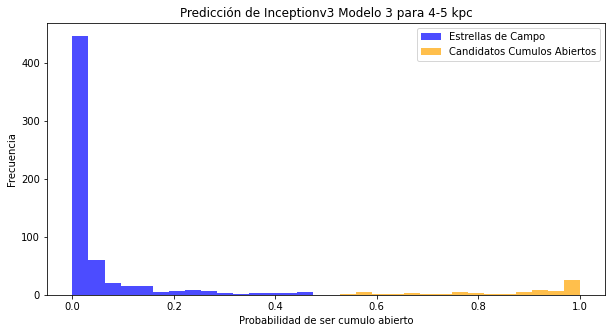

In [27]:
prediccion_shell1=list(resultados.values())
threshold = 0.5

# Split data into two groups
data_below_threshold = [x for x in prediccion_shell1 if x <= threshold]
data_above_threshold = [x for x in prediccion_shell1 if x > threshold]
# Plot histograms
plt.figure(figsize=(10, 5))
plt.hist(data_below_threshold, bins=15, color='blue', alpha=0.7, label="Estrellas de Campo")
plt.hist(data_above_threshold, bins=15, color='orange', alpha=0.7, label="Candidatos Cumulos Abiertos")
#plt.yscale("log")
# Add labels and legend
plt.xlabel('Probabilidad de ser cumulo abierto')
plt.ylabel('Frecuencia')
plt.title('Predicción de Inceptionv3 Modelo 3 para 4-5 kpc')
plt.legend()

# Show plot
plt.show()

In [7]:
cumulos_resultados={}
campo_resultados={}
llaves=resultados.keys()
for x in llaves:
    valor=resultados[x]
    if valor >0.5:
        cumulos_resultados[x]=valor
    else:
        campo_resultados[x]=valor

len(cumulos_resultados), len(campo_resultados)

(73, 603)

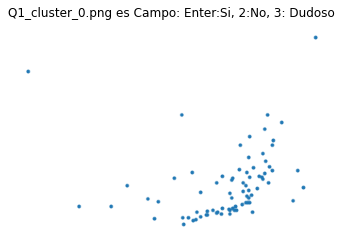

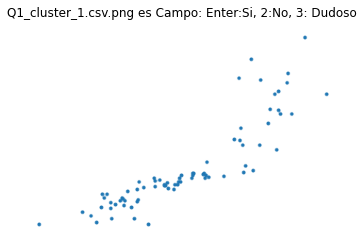

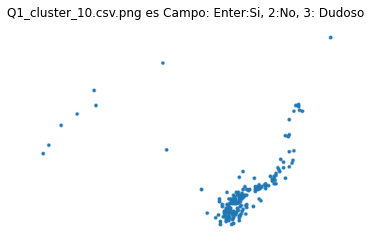

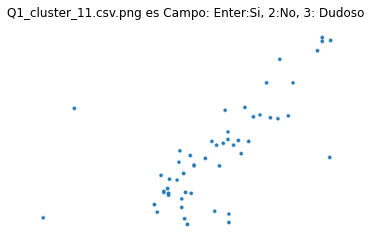

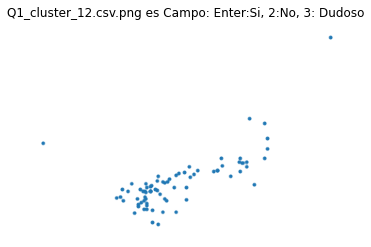

...

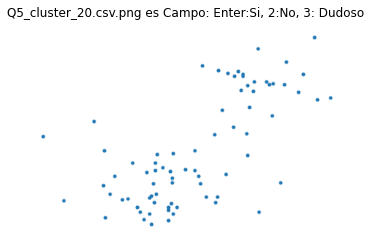

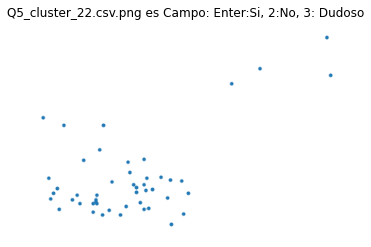

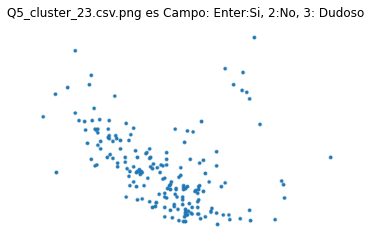

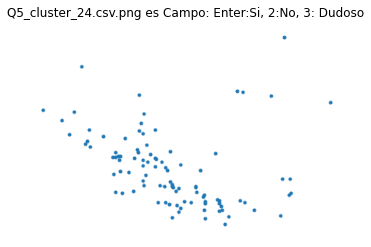

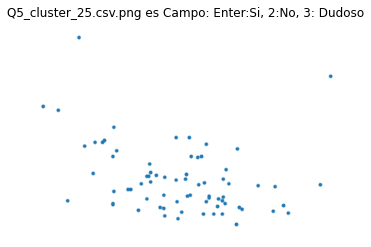

All images have been displayed.


In [9]:
# Folder path and list of image names
folder_path = clasificar_shell1  # Replace with your folder path
image_names = list(campo_resultados.keys())  # Replace with your list of image names

image_names1=image_names[:len(image_names)//2]
image_names2=image_names[len(image_names)//2:]

verificacion_campo={}
for image_name in image_names1:
    # Full path to the image
    image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better viewing
    plt.title(image_name+" es Campo: Enter:Si, 2:No, 3: Dudoso")
    plt.show()
    
    # Wait for user input
    while True:
        user_input = input(f"Enter True or False for {image_name}: ")
        if user_input in ["", "2","3"]:
            if user_input=="":
                user_input=["True",campo_resultados[image_name]]
            elif user_input=="2":
                user_input=["False",campo_resultados[image_name]]
            elif user_input=="3":
                user_input=["Dudoso",campo_resultados[image_name]]
            verificacion_campo[image_name]=user_input
            break  # Proceed to the next image if input is valid
        else:
            print("Please enter either 'True' or 'False'.")

print("All images have been displayed.")


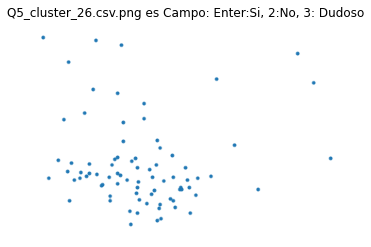

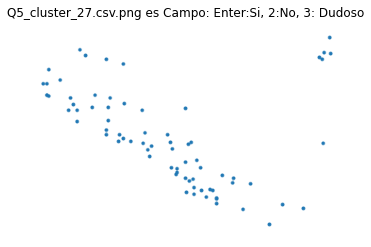

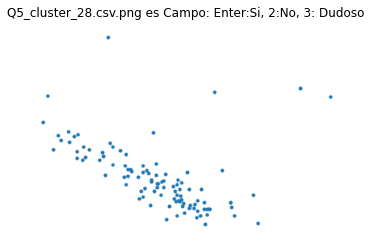

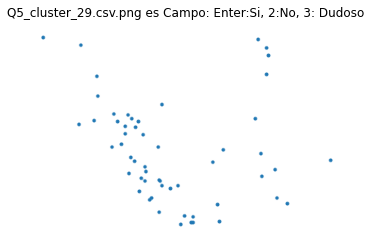

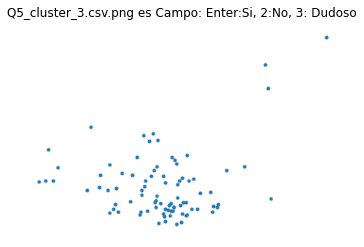

...

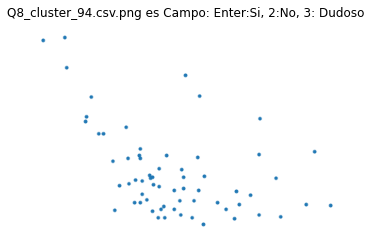

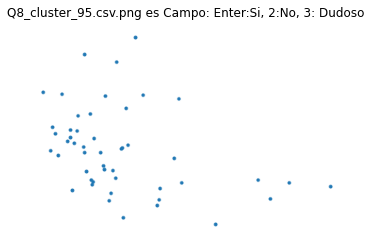

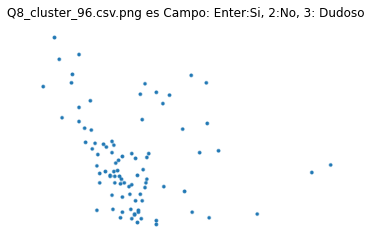

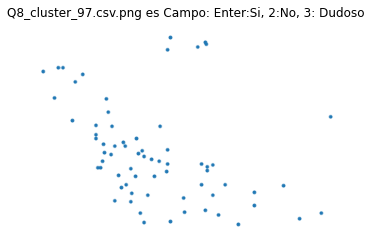

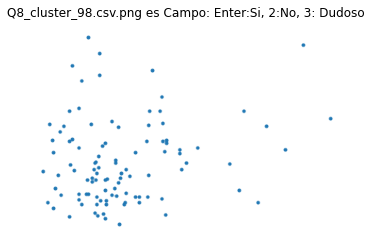

All images have been displayed.


In [10]:
for image_name in image_names2:
    # Full path to the image
    image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better viewing
    plt.title(image_name+" es Campo: Enter:Si, 2:No, 3: Dudoso")
    plt.show()
    
    # Wait for user input
    while True:
        user_input = input(f"Enter True or False for {image_name}: ")
        if user_input in ["", "2","3"]:
            if user_input=="":
                user_input=["True",campo_resultados[image_name]]
            elif user_input=="2":
                user_input=["False",campo_resultados[image_name]]
            elif user_input=="3":
                user_input=["Dudoso",campo_resultados[image_name]]
            verificacion_campo[image_name]=user_input
            break  # Proceed to the next image if input is valid
        else:
            print("Please enter either 'True' or 'False'.")

print("All images have been displayed.")


In [11]:
falsos_negativos=0
campos_dudosos=0
for x in verificacion_campo.keys():
    if verificacion_campo[x][0]=="False":
        falsos_negativos+=1
    if verificacion_campo[x][0]=="Dudoso":
        campos_dudosos+=1
    
print(falsos_negativos, campos_dudosos)

10 15


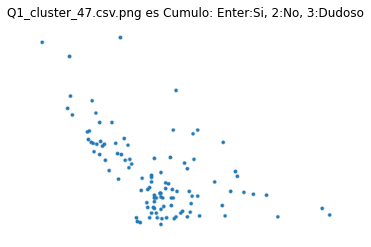

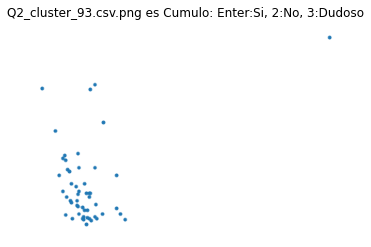

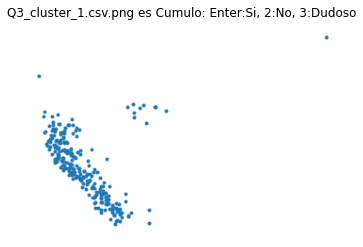

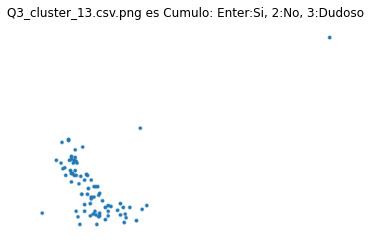

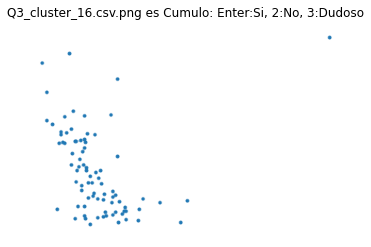

...

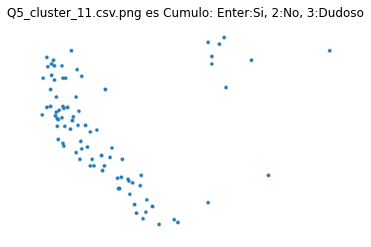

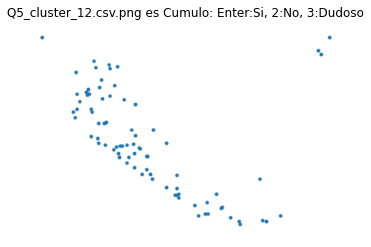

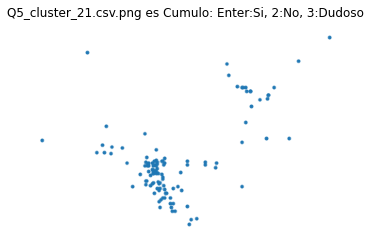

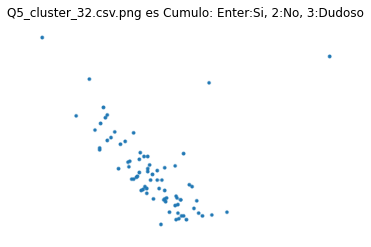

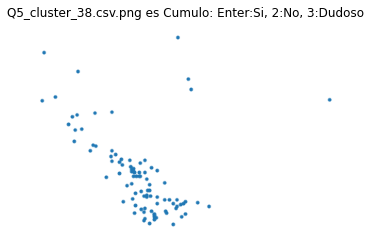

Please enter either 'True' or 'False'.


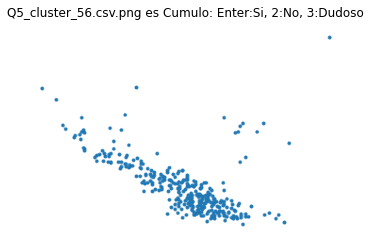

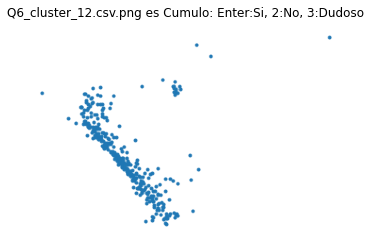

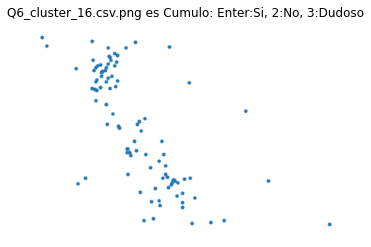

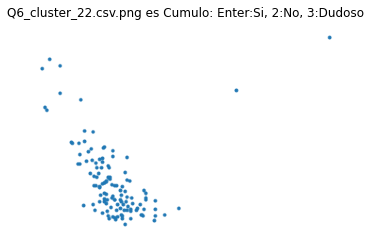

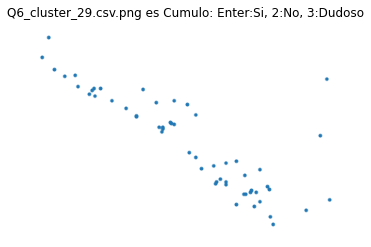

...

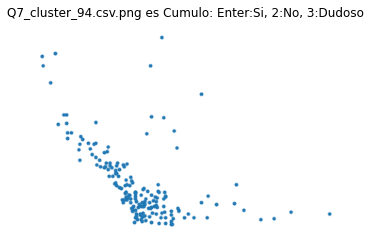

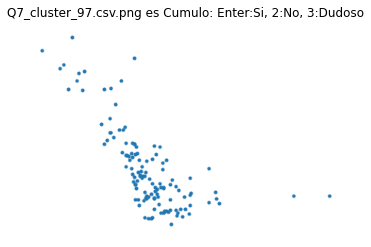

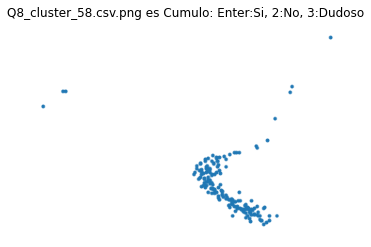

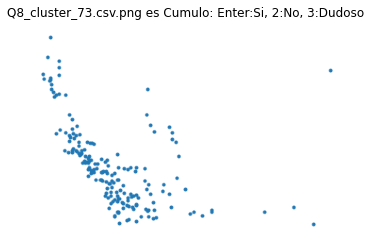

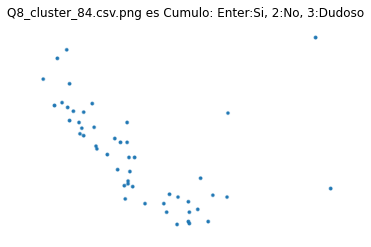

All images have been displayed.


In [12]:
# Folder path and list of image names
folder_path = clasificar_shell1  # Replace with your folder path
image_names = cumulos_resultados.keys()  # Replace with your list of image names
verificacion_cumulo={}
for image_name in image_names:
    # Full path to the image
    image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better viewing
    plt.title(image_name+" es Cumulo: Enter:Si, 2:No, 3:Dudoso")
    plt.show()
    
    # Wait for user input
    while True:
        user_input = input(f"Enter True or False for {image_name}: ")
        if user_input in ["", "2","3"]:
            if user_input=="":
                user_input=["True",cumulos_resultados[image_name]]
            elif user_input=="2":
                user_input=["False",cumulos_resultados[image_name]]
            elif user_input=="3":
                user_input=["Dudoso",cumulos_resultados[image_name]]
            verificacion_cumulo[image_name]=user_input
            break  # Proceed to the next image if input is valid
        else:
            print("Please enter either 'True' or 'False'.")

print("All images have been displayed.")


In [13]:
falsos_positivos=0
cumulos_dudosos=0
for x in verificacion_cumulo.keys():
    if verificacion_cumulo[x][0]=="False":
        falsos_positivos+=1
    if verificacion_cumulo[x][0]=="Dudoso":
        cumulos_dudosos+=1

print(falsos_positivos, cumulos_dudosos)

8 11


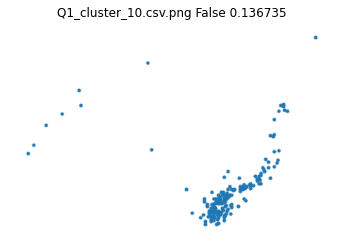

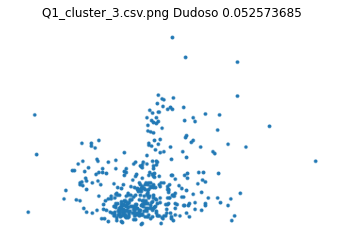

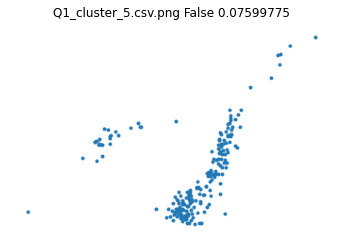

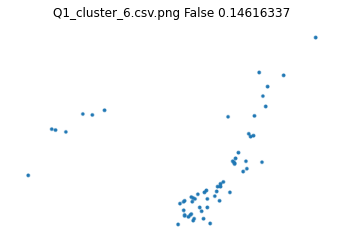

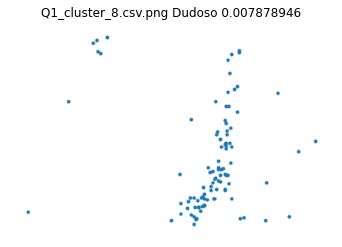

...

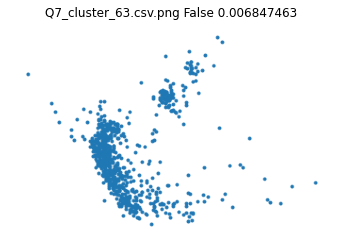

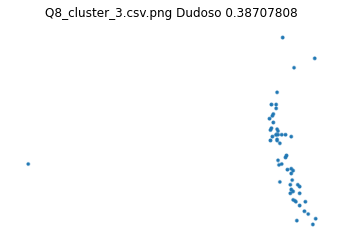

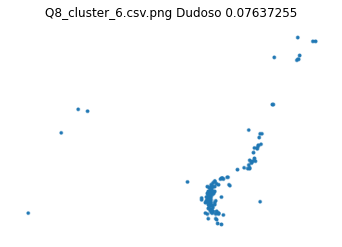

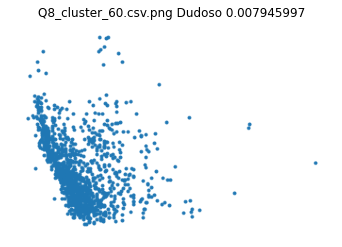

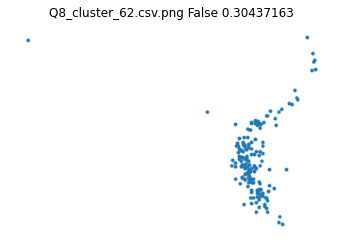

All images have been displayed.


In [ ]:
image_names = verificacion_campo.keys()  # Replace with your list of image names
for image_name in image_names:
    # Full path to the image
    if verificacion_campo[image_name][0]=="False" or verificacion_campo[image_name][0]=="Dudoso":
        image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.axis('off')  # Hide axis for better viewing
        plt.title(image_name+" " +str(verificacion_campo[image_name][0])+" "+str(verificacion_campo[image_name][1]))
        plt.show()

print("All images have been displayed.")


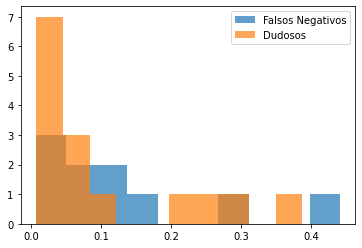

In [25]:
falsos_negativos_probabilidad=[]
falsos_dudosos_probabilidad=[]
image_names = verificacion_campo.keys()  # Replace with your list of image names
for image_name in image_names:
    # Full path to the image
    if verificacion_campo[image_name][0]=="False":
        falsos_negativos_probabilidad.append(verificacion_campo[image_name][1])
    if verificacion_campo[image_name][0]=="Dudoso":
        falsos_dudosos_probabilidad.append(verificacion_campo[image_name][1])
        

plt.hist(falsos_negativos_probabilidad,alpha=0.7,label="Falsos Negativos")
plt.hist(falsos_dudosos_probabilidad,alpha=0.7,label="Dudosos")
plt.legend()
plt.show()

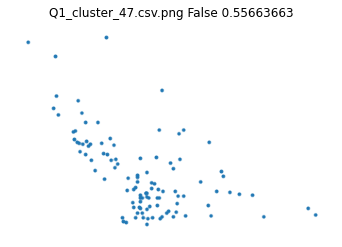

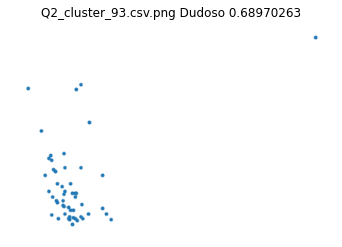

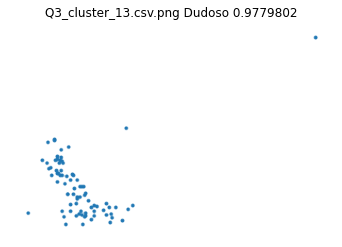

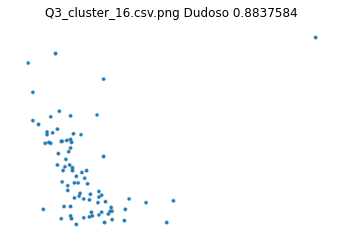

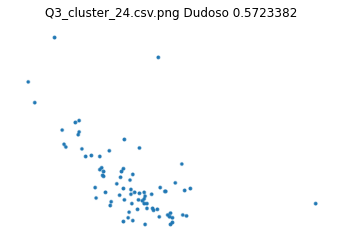

...

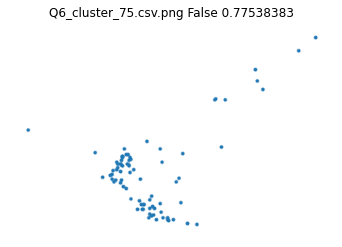

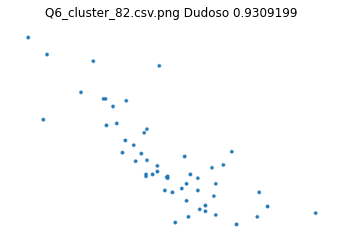

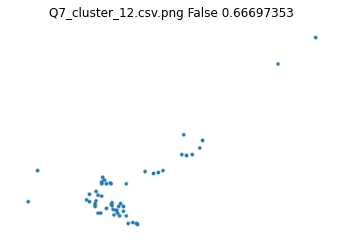

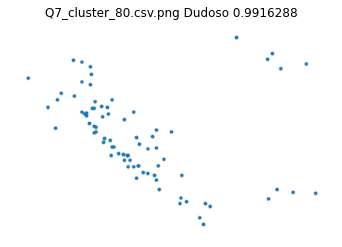

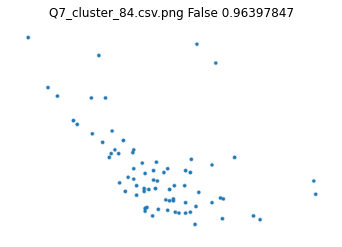

All images have been displayed.


In [22]:
image_names = verificacion_cumulo.keys()  # Replace with your list of image names
for image_name in image_names:
    # Full path to the image
    if verificacion_cumulo[image_name][0]=="False" or verificacion_cumulo[image_name][0]=="Dudoso":
        image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.axis('off')  # Hide axis for better viewing
        plt.title(image_name+" " +str(verificacion_cumulo[image_name][0])+" "+str(verificacion_cumulo[image_name][1]))
        plt.show()

print("All images have been displayed.")

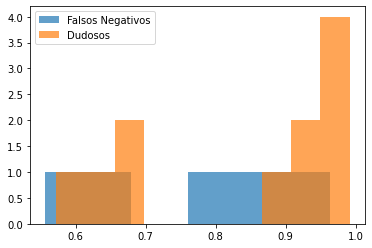

In [26]:
falsos_positivos_probabilidad=[]
positivos_dudosos_probabilidad=[]
image_names = verificacion_cumulo.keys()  # Replace with your list of image names
for image_name in image_names:
    # Full path to the image
    if verificacion_cumulo[image_name][0]=="False":
        falsos_positivos_probabilidad.append(verificacion_cumulo[image_name][1])
    if verificacion_cumulo[image_name][0]=="Dudoso":
        positivos_dudosos_probabilidad.append(verificacion_cumulo[image_name][1])
        

plt.hist(falsos_positivos_probabilidad,alpha=0.7,label="Falsos Negativos")
plt.hist(positivos_dudosos_probabilidad,alpha=0.7,label="Dudosos")
plt.legend()
plt.show()

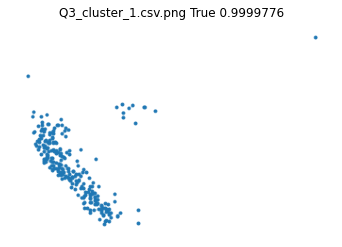

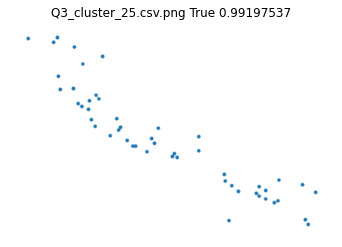

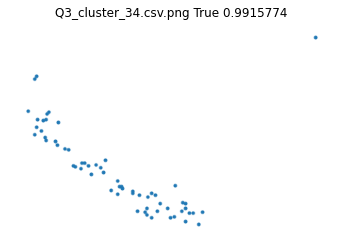

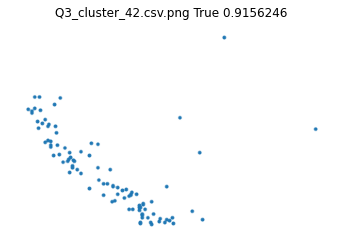

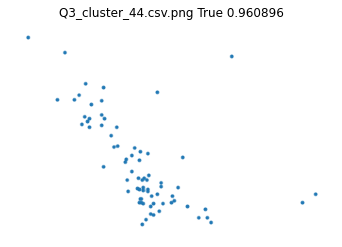

...

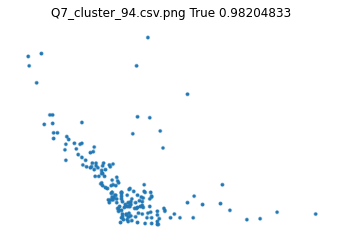

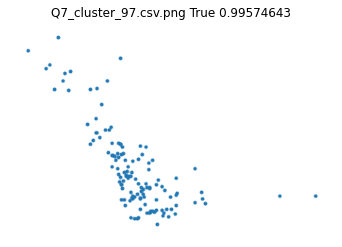

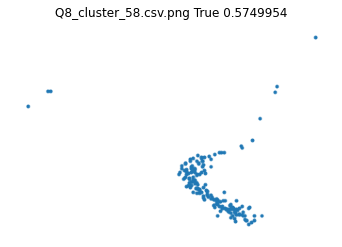

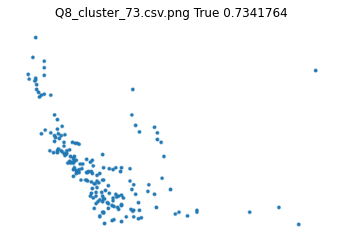

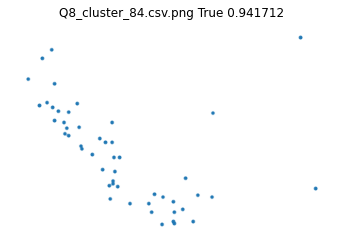

All images have been displayed.


In [28]:
image_names = verificacion_cumulo.keys()  # Replace with your list of image names
for image_name in image_names:
    # Full path to the image
    if verificacion_cumulo[image_name][0]=="True":
        image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.axis('off')  # Hide axis for better viewing
        plt.title(image_name+" " +str(verificacion_cumulo[image_name][0])+" "+str(verificacion_cumulo[image_name][1]))
        plt.show()

print("All images have been displayed.")

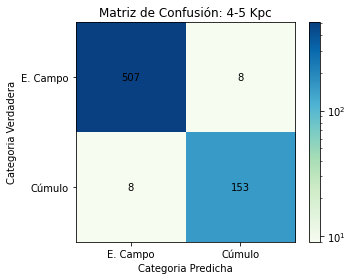

153 507 8 8
Precision: 0.9503105590062112
Recall: 0.9503105590062112
F1 Score: 0.9503105590062112


In [2]:
# Confusion matrix
array = np.array([[507, 8], [8, 153]])
# Define labels for rows and columns
labels = ["E. Campo", "Cúmulo"]

# Create the plot with a logarithmic color scale
plt.figure(figsize=(5, 4))  # Adjusted size to make the plot more compact
norm = mcolors.LogNorm(vmin=array.min() + 1, vmax=array.max())  # Log scale, vmin is adjusted to avoid log(0)
plt.imshow(array, interpolation="nearest", cmap="GnBu", norm=norm)
plt.colorbar()

# Add labels to x and y axes
plt.xticks([0, 1], labels)
plt.yticks([0, 1], labels)
plt.xlabel("Categoria Predicha")
plt.ylabel("Categoria Verdadera")
plt.title("Matriz de Confusión: 4-5 Kpc")

# Add text annotations
for i in range(array.shape[0]):
    for j in range(array.shape[1]):
        plt.text(j, i, f"{array[i, j]}", ha="center", va="center", color="black")

plt.tight_layout()  # Reduces the extra whitespace around the plot
plt.show()
# Extract the values
TN, FP = array[0, 0], array[0, 1]
FN, TP = array[1, 0], array[1, 1]

# Calculate precision, recall, and F1 score
precision = TP / (TP + FP)
recall = TP / (TP + FN)
print(TP, TN, FP, FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

In [26]:
modelo_path=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\9 Semestre\TESIS\modelos\modelo1_prueba3.keras"
model.save(modelo_path,zipped=True)

### Shell 2

In [ ]:
# Data generators
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=False,
    vertical_flip=False,
#    validation_split=0.2  # 20% for validation
)

# CAMBIAR SHELL 1 O SHELL 2
train_data_dir = shell2

# Training data
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(253, 385),
    batch_size=32,
    class_mode='binary',
    classes=['no-cumulos', 'cumulos'],
    shuffle=True,
    #subset='training'  # Training set (80%)
)

def get_model():
    base_model = InceptionV3(input_shape = (253,385,3), weights='imagenet', include_top=False)
    x = base_model.output
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dense(1024, activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Dense(512, activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    predictions = keras.layers.Dense(1, activation='sigmoid')(x)
    model = keras.models.Model(inputs=base_model.input, outputs=predictions)
    for layer in base_model.layers:
        layer.trainable = False #Originalmente False, True en prueba
        
    for layer in base_model.layers[-150:]:
        layer.trainable = True
    return model
model = get_model()

# Compile the model
METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
]
model.compile(
    optimizer=keras.optimizers.Adam(0.001),
    loss='binary_crossentropy',
    metrics=METRICS)

model.fit(
    train_generator,
    epochs=10)


Found 10272 images belonging to 2 classes.


c:\Users\juang\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
321/321 ━━━━━━━━━━━━━━━━━━━━ 1023s 3s/step - accuracy: 0.8889 - auc: 0.9442 - fn: 320.7422 - fp: 167.5963 - loss: 0.3160 - precision: 0.9179 - recall: 0.8555 - tn: 2408.9348 - tp: 2270.6274
Epoch 2/10
321/321 ━━━━━━━━━━━━━━━━━━━━ 946s 3s/step - accuracy: 0.9238 - auc: 0.9733 - fn: 246.9689 - fp: 132.8261 - loss: 0.1984 - precision: 0.9432 - recall: 0.9021 - tn: 2449.8696 - tp: 2338.2361
Epoch 3/10
321/321 ━━━━━━━━━━━━━━━━━━━━ 903s 3s/step - accuracy: 0.9295 - auc: 0.9760 - fn: 235.7609 - fp: 118.2050 - loss: 0.1840 - precision: 0.9512 - recall: 0.9075 - tn: 2457.1055 - tp: 2356.8291
Epoch 4/10
321/321 ━━━━━━━━━━━━━━━━━━━━ 815s 3s/step - accuracy: 0.9345 - auc: 0.9809 - fn: 215.1056 - fp: 125.8230 - loss: 0.1646 - precision: 0.9495 - recall: 0.9189 - tn: 2452.7671 - tp: 2374.2051
Epoch 5/10
321/321 ━━━━━━━━━━━━━━━━━━━━ 797s 2s/step - accuracy: 0.9415 - auc: 0.9814 - fn: 207.0714 - fp: 105.5932 - loss: 0.1596 - precision: 0.9599 - recall: 0.9216 - tn: 2480.2297 - tp: 2375.0061

In [3]:
epochs = list(range(1, 11))  # Epochs 1 to 10

accuracy = [0.8889, 0.9238, 0.9295, 0.9345, 0.9415, 0.9422, 0.9463, 0.9432, 0.9495, 0.9457]
auc = [0.9442, 0.9733, 0.9760, 0.9809, 0.9814, 0.9824, 0.9863, 0.9862, 0.9885, 0.9850]
fn = [320.7422, 246.9689, 235.7609, 215.1056, 207.0714, 200.2640, 182.1956, 177.7702, 159.8106, 179.6615]
fp = [167.5963, 132.8261, 118.2050, 125.8230, 105.5932, 111.1646, 103.2236, 108.0124, 99.9876, 92.3540]
loss = [0.3160, 0.1984, 0.1840, 0.1646, 0.1596, 0.1566, 0.1380, 0.1436, 0.1303, 0.1456]
precision = [0.9179, 0.9432, 0.9512, 0.9495, 0.9599, 0.9553, 0.9593, 0.9529, 0.9596, 0.9639]
recall = [0.8555, 0.9021, 0.9075, 0.9189, 0.9216, 0.9269, 0.9315, 0.9306, 0.9383, 0.9263]
tn = [2408.9348, 2449.8696, 2457.1055, 2452.7671, 2480.2297, 2464.1274, 2486.3789, 2500.4722, 2478.4255, 2493.9285]
tp = [2270.6274, 2338.2361, 2356.8291, 2374.2051, 2375.0061, 2392.3447, 2396.1025, 2381.6460, 2429.6770, 2401.9565]


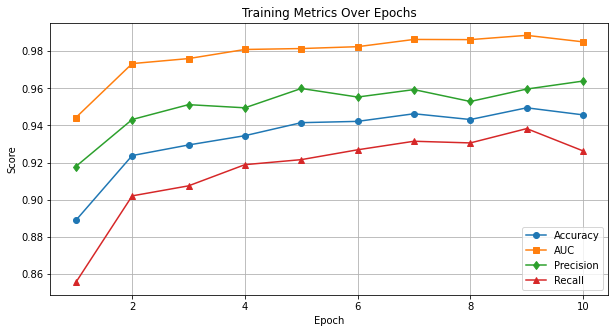

In [4]:
plt.figure(figsize=(10, 5))
plt.plot(epochs, accuracy, label="Accuracy", marker="o")
plt.plot(epochs, auc, label="AUC", marker="s")
plt.plot(epochs, precision, label="Precision", marker="d")
plt.plot(epochs, recall, label="Recall", marker="^")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Training Metrics Over Epochs")
plt.legend()
plt.grid()
plt.show()

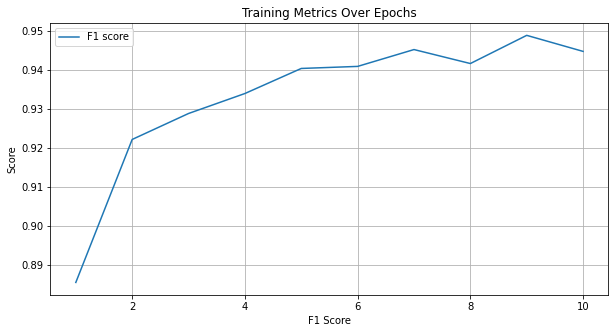

0.9488304757890301


In [6]:
plt.figure(figsize=(10, 5))
f1score=[]
for i in range(10):
    x=2*((precision[i]*recall[i])/(precision[i]+recall[i]))
    f1score.append(x)
plt.plot(epochs, f1score, label="F1 score")
plt.xlabel("F1 Score")
plt.ylabel("Score")
plt.title("Training Metrics Over Epochs")
plt.legend()
plt.grid()
plt.show()
print(f1score[-2])

In [8]:
modelo_path=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\9 Semestre\TESIS\modelos\modelo2.keras"
model.save(modelo_path,zipped=True)

### Cargar modelo

In [4]:
modelo_path_new=r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\9 Semestre\TESIS\modelos\modelo2.keras"
new_model = tf.keras.models.load_model(modelo_path_new)


In [5]:
resultados={}
folder_path = r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2_diagramas\shell2\prueba"
for file in os.listdir(folder_path):
    img_path=os.path.join(folder_path,file)
    img = image.load_img(img_path, target_size=(253, 385))
 # Preprocessing the image
    x = image.img_to_array(img)
# x = np.true_divide(x, 255)
## Scaling
    x=x/255
    x = np.expand_dims(x, axis=0)
    preds = new_model.predict(x)
#preds=np.argmax(preds, axis=1)

    print(file+"   :"+str(preds))
    resultados[file]=preds[0][0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Q1_cluster_0.csv.png   :[[0.00559324]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_1.csv.png   :[[0.7864413]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_10.csv.png   :[[0.8782289]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_100.csv.png   :[[0.00209848]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
Q1_cluster_101.csv.png   :[[0.3497485]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Q1_cluster_102.csv.png   :[[0.00158038]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Q1_cluster_103.csv.png   :[[0.00320929]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Q1_cluster_104.csv.png   :[[0.20772447]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Q1_cluster_105.csv.png   :[[0.06442519]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Q1_cluster_106.csv.png   :[[0.00122841]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Q1_cluster_107.csv.png   :[[0.00120271]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Q1_cluster_108.csv.png   :[[0.00042473]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
Q1_cluster_1

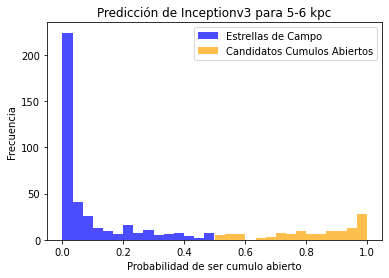

In [ ]:
prediccion_shell2=list(resultados.values())
threshold = 0.5

# Split data into two groups
data_below_threshold = [x for x in prediccion_shell2 if x <= threshold]
data_above_threshold = [x for x in prediccion_shell2 if x > threshold]
# Plot histograms
plt.hist(data_below_threshold, bins=15, color='blue', alpha=0.7, label="Zonas de Campo Estelar")
plt.hist(data_above_threshold, bins=15, color='orange', alpha=0.7, label="Candidatos Cumulos Abiertos")

# Add labels and legend
plt.xlabel('Probabilidad de ser cumulo abierto')
plt.ylabel('Frecuencia')
plt.title('Predicción de Inceptionv3 para 5-6 kpc')
plt.legend()

# Show plot
plt.show()

In [7]:
cumulos_resultados={}
campo_resultados={}
llaves=resultados.keys()
for x in llaves:
    valor=resultados[x]
    if valor >0.5:
        cumulos_resultados[x]=valor
    else:
        campo_resultados[x]=valor

len(cumulos_resultados), len(campo_resultados)

(115, 384)

In [ ]:
# Folder path and list of image names
folder_path = clasificar_shell2  # Replace with your folder path
image_names = campo_resultados.keys()  # Replace with your list of image names
verificacion_campo={}
for image_name in image_names:
    # Full path to the image
    image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better viewing
    plt.title(image_name+" es Campo: Enter:Si, 2:No, 3: Dudoso")
    plt.show()
    
    # Wait for user input
    while True:
        user_input = input(f"Enter True or False for {image_name}: ")
        if user_input in ["", "2","3"]:
            if user_input=="":
                user_input=["True",campo_resultados[image_name]]
            elif user_input=="2":
                user_input=["False",campo_resultados[image_name]]
            elif user_input=="3":
                user_input=["Dudoso",campo_resultados[image_name]]
            verificacion_campo[image_name]=user_input
            break  # Proceed to the next image if input is valid
        else:
            print("Please enter either 'True' or 'False'.")

print("All images have been displayed.")


In [ ]:
falsos_negativos=0
campos_dudosos=0
for x in verificacion_campo.keys():
    if verificacion_campo[x][0]=="False":
        falsos_negativos+=1
    if verificacion_campo[x][0]=="Dudoso":
        campos_dudosos+=1
    
print(falsos_negativos, campos_dudosos)

3

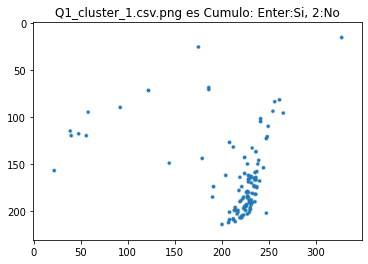

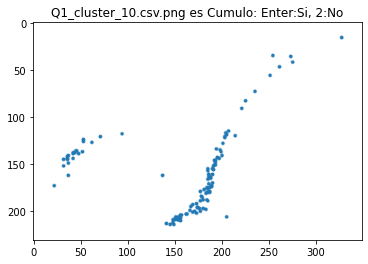

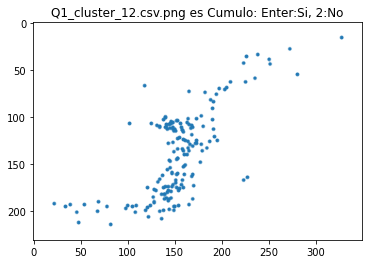

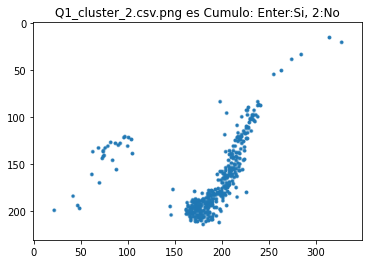

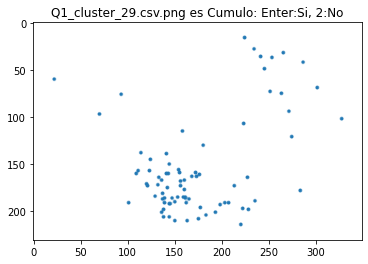

...

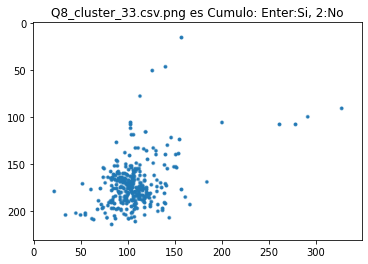

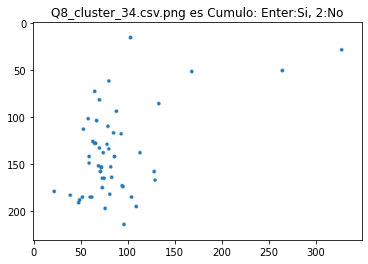

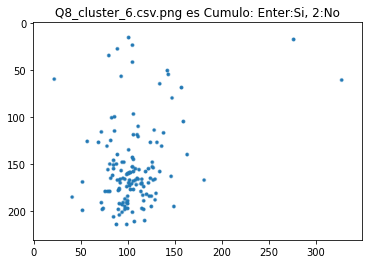

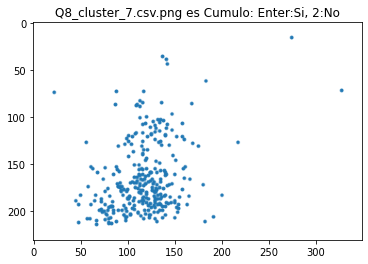

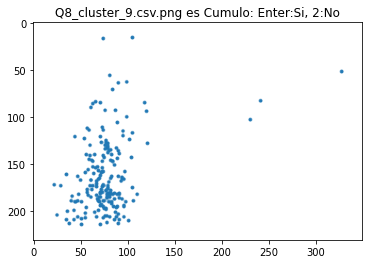

All images have been displayed.


In [ ]:
# Folder path and list of image names
folder_path = clasificar_shell2  # Replace with your folder path
image_names = cumulos_resultados.keys()  # Replace with your list of image names
verificacion_cumulo={}
for image_name in image_names:
    # Full path to the image
    image_path = os.path.join(folder_path, image_name)
    
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better viewing
    plt.title(image_name+" es Cumulo: Enter:Si, 2:No, 3:Dudoso")
    plt.show()
    
    # Wait for user input
    while True:
        user_input = input(f"Enter True or False for {image_name}: ")
        if user_input in ["", "2","3"]:
            if user_input=="":
                user_input=["True",cumulos_resultados[image_name]]
            elif user_input=="2":
                user_input=["False",cumulos_resultados[image_name]]
            elif user_input=="3":
                user_input=["Dudoso",cumulos_resultados[image_name]]
            verificacion_cumulo[image_name]=user_input
            break  # Proceed to the next image if input is valid
        else:
            print("Please enter either 'True' or 'False'.")

print("All images have been displayed.")


In [ ]:
falsos_positivos=0
cumulos_dudosos=0
for x in verificacion_cumulo.keys():
    if verificacion_cumulo[x][0]=="False":
        falsos_positivos+=1
    if verificacion_cumulo[x][0]=="Dudoso":
        cumulos_dudosos+=1

print(falsos_positivos, cumulos_dudosos)

20

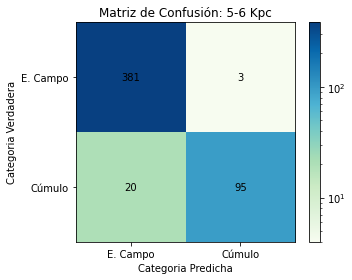

Precision: 0.9693877551020408
Recall: 0.8260869565217391
F1 Score: 0.8920187793427229


In [18]:
# Confusion matrix
array = np.array([[381, 3], [20, 95]])
# Define labels for rows and columns
labels = ["E. Campo", "Cúmulo"]

# Create the plot with a logarithmic color scale
plt.figure(figsize=(5, 4))  # Adjusted size to make the plot more compact
norm = mcolors.LogNorm(vmin=array.min() + 1, vmax=array.max())  # Log scale, vmin is adjusted to avoid log(0)
plt.imshow(array, interpolation="nearest", cmap="GnBu", norm=norm)
plt.colorbar()

# Add labels to x and y axes
plt.xticks([0, 1], labels)
plt.yticks([0, 1], labels)
plt.xlabel("Categoria Predicha")
plt.ylabel("Categoria Verdadera")
plt.title("Matriz de Confusión: 5-6 Kpc")

# Add text annotations
for i in range(array.shape[0]):
    for j in range(array.shape[1]):
        plt.text(j, i, f"{array[i, j]}", ha="center", va="center", color="black")

plt.tight_layout()  # Reduces the extra whitespace around the plot
plt.show()
# Extract the values
TN, FP = array[0, 0], array[0, 1]
FN, TP = array[1, 0], array[1, 1]

# Calculate precision, recall, and F1 score
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)